## Importing Libraries

In [ ]:
import os
import shutil
import random
import pandas as pd
from PIL import Image
import cv2
!pip install ultralytics
from ultralytics import YOLO
from IPython.display import Video
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
import pathlib
import glob
from tqdm.notebook import trange, tqdm
import warnings
warnings.filterwarnings('ignore')

In [ ]:
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

## Downloading dataset from kaggle and Unzipping files onto the working directory
`Train Images : 3530`

`Validation Images : 801`

`Test Images : 638`


Other which are included in the dataset :
 - data.yaml -> which would be used to map the data and the bounding boxes at the time of training
 - video file for testing the model

In [ ]:
!kaggle datasets download -d pkdarabi/cardetection

Dataset URL: https://www.kaggle.com/datasets/pkdarabi/cardetection
License(s): Attribution 4.0 International (CC BY 4.0)
 96%|████████████████████████████████████▌ | 96.0M/99.8M [00:02<00:00, 43.4MB/s]
100%|██████████████████████████████████████| 99.8M/99.8M [00:03<00:00, 34.7MB/s]


In [ ]:
!unzip /kaggle/working/cardetection.zip -d /kaggle/working/Traffic_Sign_Data

Archive:  /kaggle/working/cardetection.zip
replace /kaggle/working/Traffic_Sign_Data/car/README.dataset.txt? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
import os

# List the files inside the extracted dataset folder
print(os.listdir("/kaggle/working/Traffic_Sign_Data"))

['video.mp4', 'car']


## Sample Images from the dataset

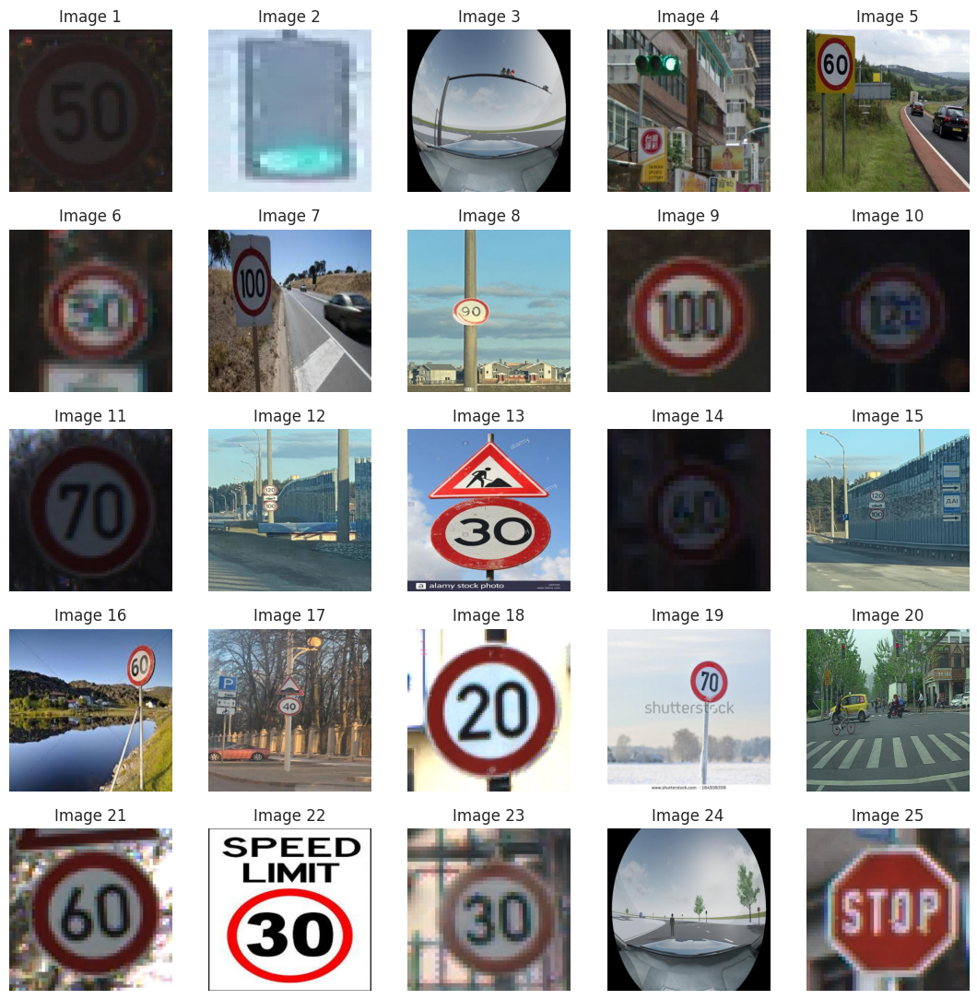

In [ ]:
Image_dir = '/kaggle/working/Traffic_Sign_Data/car/train/images'

num_samples = 25
image_files = os.listdir(Image_dir)

rand_images = random.sample(image_files, num_samples)

fig, axes = plt.subplots(5, 5, figsize=(11, 11))

for i in range(num_samples):
    image = rand_images[i]
    ax = axes[i // 5, i % 5]
    ax.imshow(plt.imread(os.path.join(Image_dir, image)))
    ax.set_title(f'Image {i+1}')
    ax.axis('off')

plt.tight_layout()
plt.show()

In [ ]:
img = cv2.imread("/kaggle/working/Traffic_Sign_Data/car/train/images/000000_jpg.rf.b11f308f16626f9f795a148029c46d10.jpg")
print(img.shape)

(416, 416, 3)


In [ ]:
!pip install --upgrade ultralytics ray

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.9/67.9 MB 26.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: ray
    Found existing installation: ray 2.42.1
    Uninstalling ray-2.42.1:
      Successfully uninstalled ray-2.42.1


## Training the Model (Detection System)
- Model Training done using the data.yaml file : which contains mapping for the images from each directory and the mapping for label(bounding boxes) for the images.

In [ ]:
model = YOLO("yolov8m.pt")
r = model.train(data="/kaggle/working/Traffic_Sign_Data/car/data.yaml",epochs=50,device="cuda",batch=-1,optimizer="auto")

100%|██████████| 49.7M/49.7M [00:00<00:00, 97.1MB/s]


Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.pt, data=/kaggle/working/Traffic_Sign_Data/car/data.yaml, epochs=50, time=None, patience=100, batch=-1, imgsz=640, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_label

100%|██████████| 755k/755k [00:00<00:00, 43.1MB/s]


Overriding model.yaml nc=80 with nc=15

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytic

100%|██████████| 5.35M/5.35M [00:00<00:00, 162MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/Traffic_Sign_Data/car/train/labels... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:02<00:00, 1221.15it/s]


train: New cache created: /kaggle/working/Traffic_Sign_Data/car/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))
AutoBatch: Computing optimal batch size for imgsz=640 at 60.0% CUDA memory utilization.
AutoBatch: CUDA:0 (Tesla P100-PCIE-16GB) 15.89G total, 0.26G reserved, 0.25G allocated, 15.38G free
      Params      GFLOPs  GPU_mem (GB)  forward (ms) backward (ms)                   input                  output
    25865005       79.11         2.305         57.34         215.5        (1, 3, 640, 640)                    list
    25865005       158.2         2.911         32.68         125.9        (2, 3, 640, 640)                    list
    25865005       316.4         3.888         54.34         179.4        (4, 3, 640, 640)                    list
    25865005       632.9         5.618         100.1   

train: Scanning /kaggle/working/Traffic_Sign_Data/car/train/labels.cache... 3530 images, 3 backgrounds, 0 corrupt: 100%|██████████| 3530/3530 [00:00<?, ?it/s]

albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))



val: Scanning /kaggle/working/Traffic_Sign_Data/car/valid/labels... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<00:00, 1287.92it/s]


val: New cache created: /kaggle/working/Traffic_Sign_Data/car/valid/labels.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      8.06G     0.8318      2.485      1.171         25        640: 100%|██████████| 221/221 [02:20<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.19it/s]

                   all        801        944      0.309      0.449      0.365      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50      8.06G       0.77      1.606      1.108         27        640: 100%|██████████| 221/221 [02:17<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.533      0.603      0.612       0.49



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      8.06G     0.7801       1.41      1.114         21        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.45it/s]

                   all        801        944       0.55      0.607      0.579      0.477



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      8.06G     0.7549      1.274        1.1         31        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.729      0.702      0.777       0.64



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      8.06G     0.7391      1.168       1.09         17        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.826      0.725      0.828       0.67



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      8.06G      0.717      1.075      1.076         32        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.869      0.759      0.849      0.706



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      8.06G      0.694      1.005      1.058         20        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.866      0.783      0.854      0.705



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      8.06G     0.6722     0.9386      1.056         15        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.906      0.783      0.869      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      8.06G     0.6563     0.9026      1.042         16        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.899      0.834      0.903      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50      8.06G     0.6526     0.8632      1.024         30        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944        0.9      0.856      0.917      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      8.06G     0.6591     0.8371      1.032         23        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.932      0.851      0.923      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      8.06G     0.6329     0.7868      1.027         22        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.926      0.867      0.935      0.783



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50      8.06G     0.6357     0.7731      1.019         31        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.951      0.848      0.936       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      8.06G      0.615     0.7502      1.019         18        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.906      0.883      0.938      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      8.06G      0.604     0.7396      1.011         26        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.942      0.867      0.938      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      8.06G     0.6035     0.7262      1.006         26        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.937      0.889      0.946      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      8.06G      0.601     0.7112      1.003         21        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.937      0.883      0.946      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      8.06G     0.5898     0.7039      1.002         23        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.942      0.829      0.927      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50      8.06G     0.5915      0.688     0.9992         15        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.46it/s]

                   all        801        944       0.95      0.873      0.949      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      8.06G     0.5927     0.6758     0.9968         18        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.949      0.914      0.958      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50      8.06G     0.5718     0.6555     0.9913         15        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.958      0.889      0.956      0.813



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      8.06G      0.575     0.6581     0.9929         22        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.949      0.894      0.956      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      8.06G     0.5729     0.6386     0.9911         31        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.937      0.911      0.958       0.82



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      8.06G      0.565     0.6273     0.9941         21        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.953      0.904       0.96      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      8.06G     0.5703     0.6206     0.9893         17        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.951       0.91      0.961      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      8.06G     0.5459      0.605     0.9841         21        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.944       0.91      0.962      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      8.06G     0.5521     0.5979     0.9834         20        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.967      0.914      0.964      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50      8.06G     0.5505     0.6027     0.9773         24        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.931      0.911      0.956      0.821



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      8.06G     0.5458     0.5849     0.9778         22        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.934      0.934      0.965      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      8.06G     0.5458     0.5754     0.9769         14        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.946      0.921      0.961      0.823



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50      8.06G      0.541     0.5576      0.975         19        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.958      0.924      0.968       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      8.06G     0.5308     0.5529     0.9733         19        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.967      0.925      0.969       0.83



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50      8.06G     0.5209     0.5404     0.9678         15        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.948      0.925      0.963      0.826



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      8.06G      0.516     0.5306     0.9616         16        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.50it/s]

                   all        801        944      0.944      0.927       0.97      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      8.06G     0.5264     0.5436     0.9688         16        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944       0.97      0.929      0.969      0.833



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50      8.06G     0.5036     0.5111     0.9623         19        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.49it/s]

                   all        801        944      0.948      0.943      0.969      0.835



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      8.06G     0.5081     0.5115     0.9543         20        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944       0.97      0.915      0.968      0.831



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      8.06G     0.5078     0.4973     0.9621         22        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.946      0.943      0.972      0.837



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      8.06G     0.5028     0.5001     0.9556         19        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.961      0.911      0.967      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      8.06G     0.4984      0.476     0.9497         19        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.953      0.934       0.97      0.843


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      8.06G     0.4945     0.2969     0.9221         13        640: 100%|██████████| 221/221 [02:17<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.957      0.934      0.967      0.838



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      8.06G     0.4894     0.2936     0.9245         14        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.961      0.941       0.97       0.84



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      8.06G     0.4902     0.2895     0.9222         11        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.963      0.938      0.971      0.834



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      8.06G     0.4736     0.2788      0.916         10        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944       0.96      0.954      0.974      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      8.06G     0.4695     0.2733     0.9121         12        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.963      0.954      0.974      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      8.06G      0.464      0.263     0.9117         10        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.963      0.944      0.975      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      8.06G     0.4555     0.2593     0.9041         12        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944       0.96      0.954      0.975      0.848



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      8.06G     0.4548     0.2551     0.8992         14        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.959      0.954      0.975      0.847



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      8.06G     0.4458     0.2475     0.9034         15        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.48it/s]

                   all        801        944      0.954      0.956      0.975      0.852



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      8.06G     0.4469     0.2472     0.9007         13        640: 100%|██████████| 221/221 [02:17<00:00,  1.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:10<00:00,  2.47it/s]

                   all        801        944      0.962      0.948      0.973      0.851



50 epochs completed in 2.067 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 52.0MB
Optimizer stripped from runs/detect/train/weights/best.pt, 52.0MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 26/26 [00:11<00:00,  2.29it/s]


                   all        801        944      0.953      0.956      0.975      0.852
           Green Light         87        122       0.88      0.844      0.908      0.548
             Red Light         74        108      0.823      0.806      0.846      0.573
       Speed Limit 100         52         52      0.972      0.981      0.995      0.897
       Speed Limit 110         17         17       0.99          1      0.995      0.928
       Speed Limit 120         60         60      0.996          1      0.995      0.935
        Speed Limit 20         56         56      0.959      0.982      0.988      0.876
        Speed Limit 30         71         74       0.93      0.973      0.992       0.94
        Speed Limit 40         53         55      0.964      0.983      0.994      0.896
        Speed Limit 50         68         71      0.959      0.972      0.989      0.872
        Speed Limit 60         76         76      0.982      0.974      0.985      0.901
        Speed Limit 7

## Model Results and Scores

In [ ]:
import pandas as pd

rm = pd.read_csv("/kaggle/working/runs/detect/train/results.csv")
rm.columns = rm.columns.str.strip()


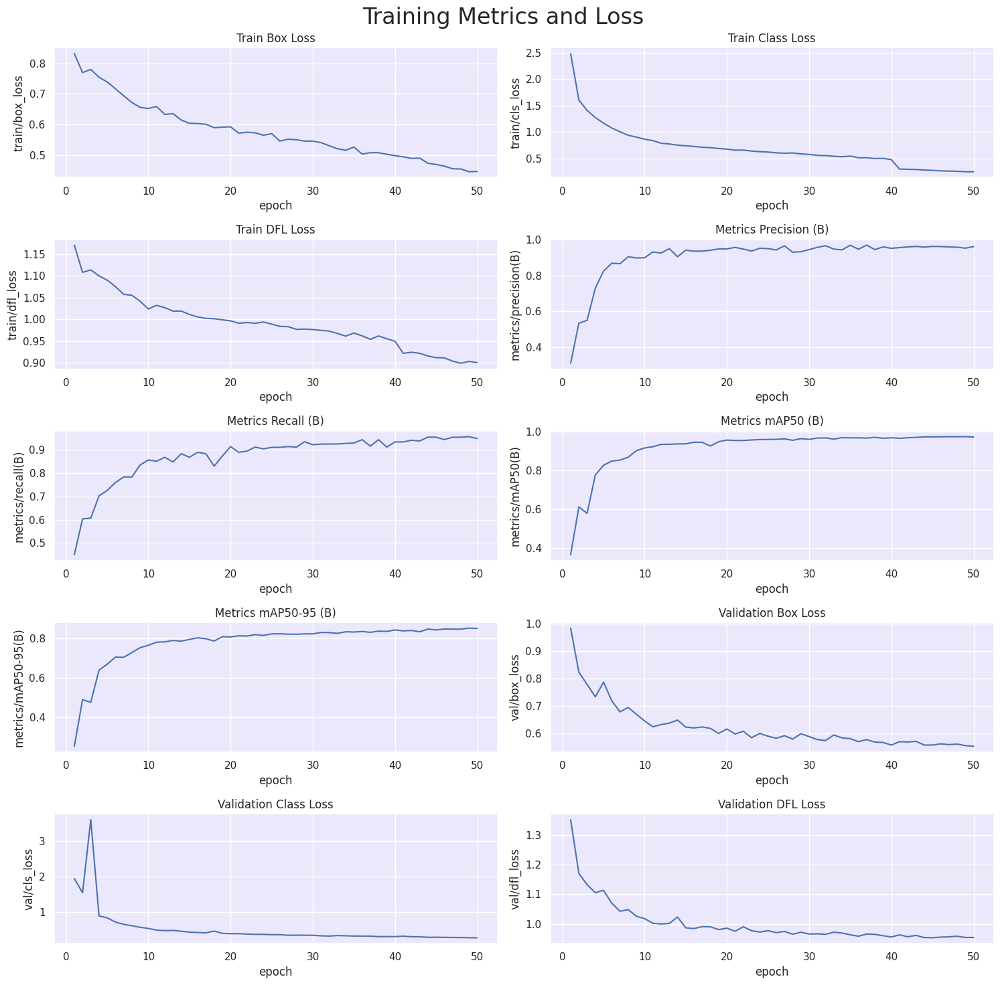

In [ ]:
fig, axs = plt.subplots(nrows=5, ncols=2, figsize=(15, 15))


sns.lineplot(x='epoch', y='train/box_loss', data=rm, ax=axs[0,0])
sns.lineplot(x='epoch', y='train/cls_loss', data=rm, ax=axs[0,1])
sns.lineplot(x='epoch', y='train/dfl_loss', data=rm, ax=axs[1,0])
sns.lineplot(x='epoch', y='metrics/precision(B)', data=rm, ax=axs[1,1])
sns.lineplot(x='epoch', y='metrics/recall(B)', data=rm, ax=axs[2,0])
sns.lineplot(x='epoch', y='metrics/mAP50(B)', data=rm, ax=axs[2,1])
sns.lineplot(x='epoch', y='metrics/mAP50-95(B)', data=rm, ax=axs[3,0])
sns.lineplot(x='epoch', y='val/box_loss', data=rm, ax=axs[3,1])
sns.lineplot(x='epoch', y='val/cls_loss', data=rm, ax=axs[4,0])
sns.lineplot(x='epoch', y='val/dfl_loss', data=rm, ax=axs[4,1])


axs[0,0].set(title='Train Box Loss')
axs[0,1].set(title='Train Class Loss')
axs[1,0].set(title='Train DFL Loss')
axs[1,1].set(title='Metrics Precision (B)')
axs[2,0].set(title='Metrics Recall (B)')
axs[2,1].set(title='Metrics mAP50 (B)')
axs[3,0].set(title='Metrics mAP50-95 (B)')
axs[3,1].set(title='Validation Box Loss')
axs[4,0].set(title='Validation Class Loss')
axs[4,1].set(title='Validation DFL Loss')


plt.suptitle('Training Metrics and Loss', fontsize=24)
plt.subplots_adjust(top=0.8)
plt.tight_layout()
plt.show()

In [ ]:
r_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')
metrics = r_model.val(split = 'val')
print("precision(B): ", metrics.results_dict["metrics/precision(B)"])
print("metrics/recall(B): ", metrics.results_dict["metrics/recall(B)"])
print("metrics/mAP50(B): ", metrics.results_dict["metrics/mAP50(B)"])
print("metrics/mAP50-95(B): ", metrics.results_dict["metrics/mAP50-95(B)"])

Ultralytics 8.3.102 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,848,445 parameters, 0 gradients, 78.7 GFLOPs


val: Scanning /kaggle/working/Traffic_Sign_Data/car/valid/labels.cache... 801 images, 0 backgrounds, 0 corrupt: 100%|██████████| 801/801 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 51/51 [00:11<00:00,  4.27it/s]


                   all        801        944       0.96      0.951      0.975      0.853
           Green Light         87        122      0.894      0.831      0.907      0.543
             Red Light         74        108      0.839      0.774      0.846      0.574
       Speed Limit 100         52         52      0.979      0.981      0.995      0.904
       Speed Limit 110         17         17          1      0.998      0.995      0.929
       Speed Limit 120         60         60      0.999          1      0.995      0.936
        Speed Limit 20         56         56      0.966      0.982      0.988      0.878
        Speed Limit 30         71         74      0.948      0.973      0.992      0.936
        Speed Limit 40         53         55      0.967      0.982      0.994      0.903
        Speed Limit 50         68         71      0.964      0.972      0.989      0.872
        Speed Limit 60         76         76      0.986      0.974      0.985      0.899
        Speed Limit 7

## Testing the Model over the Test Images


0: 640x640 1 Speed Limit 70, 16.3ms
Speed: 2.7ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 70, 16.3ms
Speed: 3.5ms preprocess, 16.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 30, 16.4ms
Speed: 3.1ms preprocess, 16.4ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Stop, 16.5ms
Speed: 4.1ms preprocess, 16.5ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Green Light, 16.5ms
Speed: 4.5ms preprocess, 16.5ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Speed Limit 100, 16.3ms
Speed: 4.0ms preprocess, 16.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Red Light, 15.9ms
Speed: 4.4ms preprocess, 15.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Green Light, 14.9ms
Speed: 4.6ms preprocess, 14.9ms inference, 1.

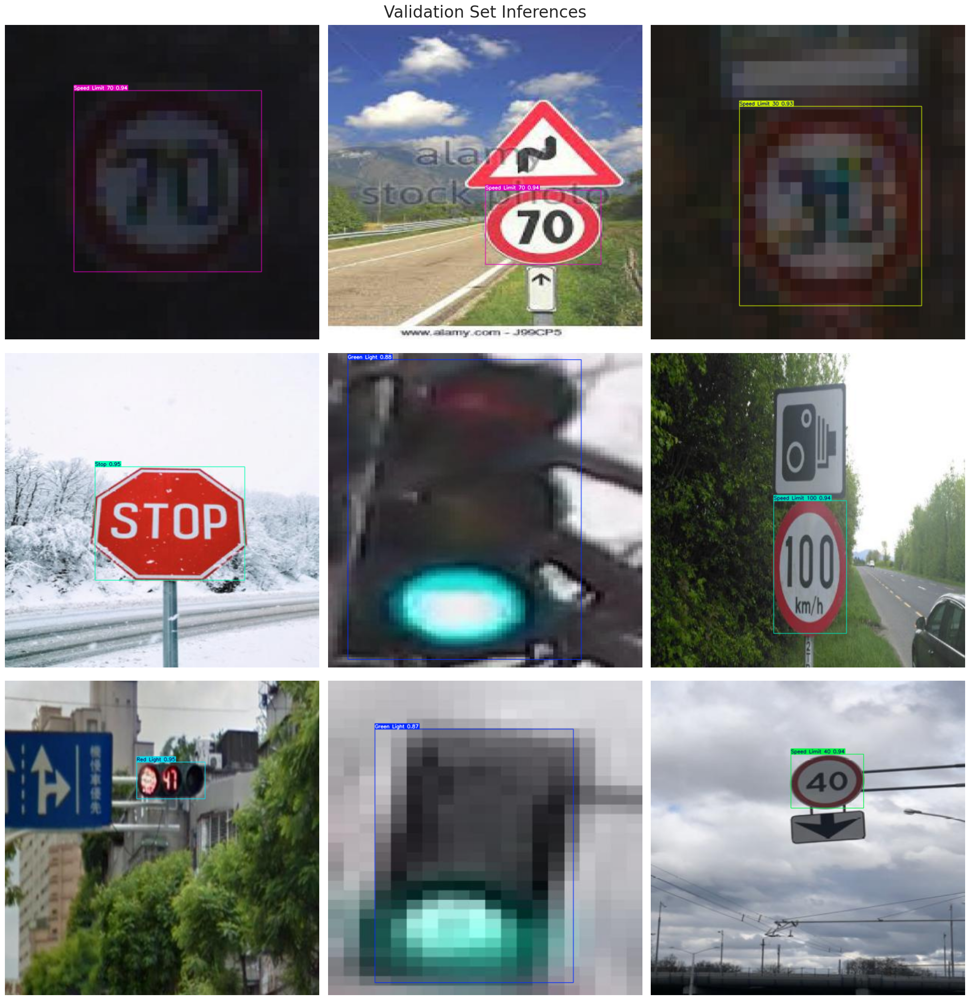

In [ ]:
def normalize_image(image):
    return image / 255.0
def resize_image(image, size=(640, 640)):
    return cv2.resize(image, size)


dataset_path = '/kaggle/working/Traffic_Sign_Data/car'
valid_images_path = os.path.join(dataset_path, 'test', 'images')

image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]


if len(image_files) > 0:

    num_images = len(image_files)
    step_size = max(1, num_images // 9)
    selected_images = [image_files[i] for i in range(0, num_images, step_size)]
    fig, axes = plt.subplots(3, 3, figsize=(20, 21))
    fig.suptitle('Validation Set Inferences', fontsize=24)

    for i, ax in enumerate(axes.flatten()):
        if i < len(selected_images):
            image_path = os.path.join(valid_images_path, selected_images[i])
            image = cv2.imread(image_path)

            if image is not None:
                resized_image = resize_image(image, size=(640, 640))
                normalized_image = normalize_image(resized_image)
                normalized_image_uint8 = (normalized_image * 255).astype(np.uint8)
                results = r_model.predict(source=normalized_image_uint8, imgsz=640, conf=0.5)

                annotated_image = results[0].plot(line_width=1)
                annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
                ax.imshow(annotated_image_rgb)
            else:
                print(f"Failed to load image {image_path}")
        ax.axis('off')

    plt.tight_layout()
    plt.show()


## Testing the Model over Video Files

In [ ]:
r_model.predict(source="/kaggle/working/Traffic_Sign_Data/video.mp4", show=True,save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/508) /kaggle/working/Traffic_Sign_Data/video.mp4: 640x640 1 Stop, 16.2ms
video 1/1 (frame 2/508) /kaggle/working/Traffic_Sign_Data/video.mp4: 640x640 1 Stop, 16.2ms
video 1/1 (frame 3/508) /kaggle/working/Traffic_Sign_Data/video.mp4: 640x640 1 Stop, 16.2ms
video 1/1 (frame 4/508) /kaggle/working/Traffic_Sign_Data/video.mp4: 640x640 1 Speed Limit 10, 15.9ms
vide

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
         [0, 0, 0],
         [0, 0, 0]],
 
        ...,
 
        [[0, 0, 0],
         [0, 0, 0],
         [0, 0, 0],
         ...,
         [0, 0, 0],
     

In [ ]:
r_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

In [ ]:
r_model.predict(source="/kaggle/input/vd-test/v3.mp4", show=True,save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 14.0ms
video 1/1 (frame 2/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 3/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 4/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 12.8ms
video 1/1 (frame 5/2653) /kaggle/i

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[ 67,  76,  64],
         [ 59,  68,  56],
         [ 52,  61,  49],
         ...,
         [217, 224, 217],
         [217, 224, 217],
         [217, 224, 217]],
 
        [[ 64,  73,  61],
         [ 59,  68,  56],
         [ 54,  63,  51],
         ...,
         [217, 224, 217],
         [217, 224, 217],
         [217, 224, 217]],
 
        [[ 55,  64,  52],
         [ 55,  64,  52],
         [ 57,  66,  54],
         ...,
         [217, 224, 217],
         [217, 224, 217],
         [217, 224, 217]],
 
      

In [ ]:
r_model.predict(source="/kaggle/input/vd-test/v4.mp4", show=True,save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 54.0ms
video 1/1 (frame 2/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 3/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 13.3ms
video 1/1 (frame 4/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 5/2112) /kaggle/i

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[227, 220, 197],
         [227, 220, 197],
         [227, 220, 197],
         ...,
         [242, 246, 232],
         [242, 246, 232],
         [242, 246, 232]],
 
        [[227, 220, 197],
         [227, 220, 197],
         [227, 220, 197],
         ...,
         [242, 246, 232],
         [242, 246, 232],
         [242, 246, 232]],
 
        [[227, 220, 197],
         [227, 220, 197],
         [227, 220, 197],
         ...,
         [242, 246, 232],
         [242, 246, 232],
         [242, 246, 232]],
 
      

In [ ]:
!pip install yt-dlp

!yt-dlp -f 'bestvideo[ext=mp4]' -o 'v2.mp4' "https://www.youtube.com/watch?v=prQ3FL6ANRo&list=PLJ8wKCP7fS9zeYO-tvSbloBtCH8elfxj"


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 172.2/172.2 kB 7.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 78.7 MB/s eta 0:00:00:00:01
[youtube:tab] Extracting URL: https://www.youtube.com/watch?v=prQ3FL6ANRo&list=PLJ8wKCP7fS9zeYO-tvSbloBtCH8elfxj
[youtube:tab] Downloading playlist PLJ8wKCP7fS9zeYO-tvSbloBtCH8elfxj - add --no-playlist to download just the video prQ3FL6ANRo
[youtube:tab] PLJ8wKCP7fS9zeYO-tvSbloBtCH8elfxj: Downloading webpage
[youtube] Extracting URL: https://www.youtube.com/watch?v=prQ3FL6ANRo
[youtube] prQ3FL6ANRo: Downloading webpage
[youtube] prQ3FL6ANRo: Downloading tv client config
[youtube] prQ3FL6ANRo: Downloading player 73381ccc-main
[youtube] prQ3FL6ANRo: Downloading tv player API JSON
[youtube] prQ3FL6ANRo: Downloading ios player API JSON
[youtube] prQ3FL6ANRo: Downloading m3u8 information
[info] prQ3FL6ANRo: Downloading 1 format(s): 137
[download] Destination: v2.mp4
[download] 100% of   55.95MiB in 00:00:12 at 4.42MiB/s0;33m00:0

In [ ]:
r_model.predict(source="/kaggle/working/v2.mp4", show=True,save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2939) /kaggle/working/v2.mp4: 384x640 (no detections), 54.0ms
video 1/1 (frame 2/2939) /kaggle/working/v2.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 3/2939) /kaggle/working/v2.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 4/2939) /kaggle/working/v2.mp4: 384x640 (no detections), 13.1ms
video 1/1 (frame 5/2939) /kaggle/working/v2.mp4: 384x640 (

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[217, 217, 217],
         [217, 217, 217],
         [217, 217, 217],
         ...,
         [217, 217, 217],
         [217, 217, 217],
         [217, 217, 217]],
 
        [[217, 217, 217],
         [217, 217, 217],
         [217, 217, 217],
         ...,
         [217, 217, 217],
         [217, 217, 217],
         [217, 217, 217]],
 
        [[217, 217, 217],
         [217, 217, 217],
         [217, 217, 217],
         ...,
         [217, 217, 217],
         [217, 217, 217],
         [217, 217, 217]],
 
      

In [ ]:
r_model = YOLO('/kaggle/input/modelt1/best.pt')

## Testing Model on Videos with confidence thresholds

In [ ]:
r_model = YOLO('/kaggle/input/modelt1/best.pt')

In [ ]:
r_model.predict(source="/kaggle/input/vd-test/v4.mp4", conf = 0.7 , show=True , save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 53.8ms
video 1/1 (frame 2/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 3/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 13.1ms
video 1/1 (frame 4/2112) /kaggle/input/vd-test/v4.mp4: 384x640 (no detections), 13.3ms
video 1/1 (frame 5/2112) /kaggle/i

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[227, 220, 197],
         [227, 220, 197],
         [227, 220, 197],
         ...,
         [242, 246, 232],
         [242, 246, 232],
         [242, 246, 232]],
 
        [[227, 220, 197],
         [227, 220, 197],
         [227, 220, 197],
         ...,
         [242, 246, 232],
         [242, 246, 232],
         [242, 246, 232]],
 
        [[227, 220, 197],
         [227, 220, 197],
         [227, 220, 197],
         ...,
         [242, 246, 232],
         [242, 246, 232],
         [242, 246, 232]],
 
      

In [ ]:
r_model.predict(source="/kaggle/input/vd-test/v3.mp4", conf = 0.7 , show=True , save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 53.7ms
video 1/1 (frame 2/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 13.0ms
video 1/1 (frame 3/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 13.3ms
video 1/1 (frame 4/2653) /kaggle/input/vd-test/v3.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 5/2653) /kaggle/i

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Green Light', 1: 'Red Light', 2: 'Speed Limit 10', 3: 'Speed Limit 100', 4: 'Speed Limit 110', 5: 'Speed Limit 120', 6: 'Speed Limit 20', 7: 'Speed Limit 30', 8: 'Speed Limit 40', 9: 'Speed Limit 50', 10: 'Speed Limit 60', 11: 'Speed Limit 70', 12: 'Speed Limit 80', 13: 'Speed Limit 90', 14: 'Stop'}
 obb: None
 orig_img: array([[[ 67,  76,  64],
         [ 59,  68,  56],
         [ 52,  61,  49],
         ...,
         [217, 224, 217],
         [217, 224, 217],
         [217, 224, 217]],
 
        [[ 64,  73,  61],
         [ 59,  68,  56],
         [ 54,  63,  51],
         ...,
         [217, 224, 217],
         [217, 224, 217],
         [217, 224, 217]],
 
        [[ 55,  64,  52],
         [ 55,  64,  52],
         [ 57,  66,  54],
         ...,
         [217, 224, 217],
         [217, 224, 217],
         [217, 224, 217]],
 
      

In [ ]:
r_model.predict(source="/kaggle/input/test-v2/video.mp4", conf = 0.7 , show=True , save = True)

WARNING ⚠️ Environment does not support cv2.imshow() or PIL Image.show()



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/42545) /kaggle/input/test-v2/video.mp4: 384x640 (no detections), 53.9ms
video 1/1 (frame 2/42545) /kaggle/input/test-v2/video.mp4: 384x640 (no detections), 13.3ms
video 1/1 (frame 3/42545) /kaggle/input/test-v2/video.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 4/42545) /kaggle/input/test-v2/video.mp4: 384x640 (no detections), 13.2ms
video 1/1 (frame 5

## Mapping Sound Alerts to the Traffic Sign Perceived (Compliance System)
- `Done How ? : Considering the Prediction value of the last frame in which traffic sign appeared`

 `why? : because -> the last frame would have the highest value for the confidence of prediction`

In [ ]:
!pip install gTTS playsound

In [ ]:
!pip install gTTS

In [ ]:
!pip install gTTS moviepy


In [ ]:
import cv2
import numpy as np
import os
from gtts import gTTS
from ultralytics import YOLO


model = YOLO("/kaggle/input/modelt1/best.pt")


os.makedirs("alerts", exist_ok=True)
os.makedirs("frames", exist_ok=True)


cap = cv2.VideoCapture("/kaggle/input/vd-test/v4.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)
frame_width, frame_height = int(cap.get(3)), int(cap.get(4))


fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter("video_without_audio.mp4", fourcc, fps, (frame_width, frame_height))

frame_number = 0
alert_data = []

announced = set()
CLASS_NAMES = model.names

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    frame_number += 1
    results = model.predict(frame, conf=0.7, verbose=False)[0]

    for box in results.boxes:
        cls_id = int(box.cls[0])
        conf = float(box.conf[0])
        label = CLASS_NAMES[cls_id]
        x1, y1, x2, y2 = map(int, box.xyxy[0])
        cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(frame, f"{label} ({conf:.2f})", (x1, y1 - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)
        if (
            x2 > frame.shape[1] * 0.9 or x1 < frame.shape[1] * 0.1 or
            y2 > frame.shape[0] * 0.9 or y1 < frame.shape[0] * 0.1
        ):
            if (label, frame_number) not in announced:
                print(f"[{frame_number}] Alert: {label}")
                audio_path = f"alerts/{label}_{frame_number}.mp3"
                gTTS(text=f"{label} ahead", lang='en').save(audio_path)

                timestamp = frame_number / fps
                alert_data.append((timestamp, audio_path))
                announced.add((label, frame_number))

    out.write(frame)

cap.release()
out.release()
cv2.destroyAllWindows()


[152] Alert: Speed Limit 80
[154] Alert: Speed Limit 80
[155] Alert: Speed Limit 80
[156] Alert: Speed Limit 80
[157] Alert: Speed Limit 80
[158] Alert: Speed Limit 80
[159] Alert: Speed Limit 80
[344] Alert: Speed Limit 60
[345] Alert: Speed Limit 60
[346] Alert: Speed Limit 60
[347] Alert: Speed Limit 60
[348] Alert: Speed Limit 60
[349] Alert: Speed Limit 60
[350] Alert: Speed Limit 60
[351] Alert: Speed Limit 60
[352] Alert: Speed Limit 60
[353] Alert: Speed Limit 60
[408] Alert: Speed Limit 40
[409] Alert: Speed Limit 40
[410] Alert: Speed Limit 40
[411] Alert: Speed Limit 40
[412] Alert: Speed Limit 40
[413] Alert: Speed Limit 40
[414] Alert: Speed Limit 40
[415] Alert: Speed Limit 40
[416] Alert: Speed Limit 40
[1305] Alert: Speed Limit 80
[1313] Alert: Speed Limit 60
[1314] Alert: Speed Limit 60
[1328] Alert: Speed Limit 60
[1329] Alert: Speed Limit 60
[1330] Alert: Speed Limit 60
[1331] Alert: Speed Limit 60
[1332] Alert: Speed Limit 60
[1333] Alert: Speed Limit 60
[1334] Aler

Saving the files

In [ ]:
from moviepy.editor import VideoFileClip, AudioFileClip, CompositeAudioClip


video_clip = VideoFileClip("video_without_audio.mp4")
audio_clips = []
for timestamp, audio_path in alert_data:
    audio = AudioFileClip(audio_path).set_start(timestamp)
    audio_clips.append(audio)


final_audio = CompositeAudioClip(audio_clips)
final_video = video_clip.set_audio(final_audio)
final_video.write_videofile("final_video_with_alerts.mp4", codec='libx264')


Moviepy - Building video final_video_with_alerts.mp4.
MoviePy - Writing audio in final_video_with_alertsTEMP_MPY_wvf_snd.mp3


MoviePy - Done.
Moviepy - Writing video final_video_with_alerts.mp4



Moviepy - Done !
Moviepy - video ready final_video_with_alerts.mp4
